# Building a GAN

In this section, we will look at the construction of a GAN. 
Specifically, we will build a DCGAN, where the DC stands for *Deep Convolutional*. 
This demonstration is adapted from the [`pytorch` tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)./ 

We will train the GAN on images of famous people from the so-called [Celeb-A Faces dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html).
We read the data using the `ImageFolder` method and present 64 of the images below. 
````{margin}
```{note}
For training this GAN, we used a subset of the image data available, specifically the first 59999 images.
To download the images, use the link to the left and select the Align&Cropped Images download, then find the `img_align_celeba` folder.  
```
````


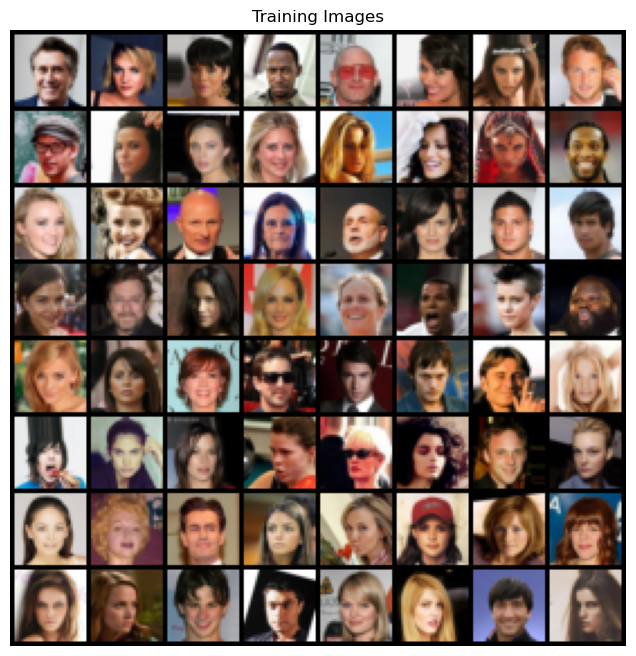

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

image_size = 32
batch_size = 64

dataset = dset.ImageFolder(root='../data/img_align_celeba',
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=2, shuffle=True)

real_batch = next(iter(dataloader))

fig, ax = plt.subplots(figsize=(8,8))
ax.axis("off")
ax.set_title("Training Images")
ax.imshow(np.transpose(vutils.make_grid(real_batch[0], padding=2, normalize=True),(1,2,0)))
plt.show()

## Model and Weights

The standard approach to weight initialisation for the DCGAN model is that all model weights should be initialised randomly from a Normal distribution centred on 0 with a standard deviation of 0.02. 
The function below makes this the case for the relevant weights. 
We will use this in both the generator and discriminator models. 

In [2]:
import torch.nn as nn

def weights_init(m):
    """
    Custom weight initialization
    
    :param m: model
    """ 
    classname = m.__class__.__name__
    if classname.find('Conv') != -1: 
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

The generator will be used to create fake data, such as images. 
The generator starts with a random noise latent vector. 
It uses three convolutional layers with batch normalisation, a ReLU activation function between each one, and a hyperbolic tangent activation function to generate the fake image. 

In [3]:
class Generator(nn.Module):
    """
    Generator network

    :param len_z: length of the input noise vector
    :param len_feature: length of the feature vector
    :param n_channels: number of channels in the image
    """
    def __init__(self, len_z, len_feature, n_channels):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(len_z, len_feature * 8, 4, 1, 0, bias=False),
                nn.BatchNorm2d(len_feature * 8),
                nn.ReLU(True),

                nn.ConvTranspose2d(len_feature * 8, len_feature * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(len_feature * 4),
                nn.ReLU(True),

                nn.ConvTranspose2d(len_feature * 4, len_feature * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(len_feature * 2),
                nn.ReLU(True),

                nn.ConvTranspose2d(len_feature * 2, n_channels, 4, 2, 1, bias=False),
                nn.Tanh()
        )

    def forward(self, input):
        """
        Forward pass
        
        :param input: input tensor
        :return: output tensor
        """
        return self.main(input)

We can now initialise the generator and apply the initial weighting function. 
We use a noise vector input of 100 and a feature vector of 64 and 3 (RGB) channels. 

In [4]:
generator = Generator(100, 32, 3)

generator.apply(weights_init)

print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Next, we create the discriminator, a binary classification network that takes the image as an input and outputs a scalar probability that the image is real (instead of fake). 
Specifically, the network involves a series of convolutional filters, batch normalisations and Leaky ReLU activation layers. 
Finally, the probability is found with a sigmoid or logistic function.
````{margin}
```{note}
It is common practice in DCGANs to use a strided convolution rather than pooling to downsample the data, allowing the network to *learn* its own pooling function. 
```
````

In [5]:
class Discriminator(nn.Module):
    """
    Discriminator network
    
    :param n_channels: number of channels in the image
    :param len_feature: length of the feature vector
    """
    def __init__(self, n_channels, len_feature):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(n_channels, len_feature, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(len_feature, len_feature * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(len_feature * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(len_feature * 2, len_feature * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(len_feature * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(len_feature * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Similar to the generator, we initialise the object and apply the weights.

In [6]:
discriminator = Discriminator(3, 32)

discriminator.apply(weights_init)

print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)


## Loss Functions and Optimisers 

We will use the BCELoss along with the Adam optimiser for the loss function. 

In [7]:
loss_fn = nn.BCELoss()

optimiser_generator = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimiser_discriminator = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

## Training

Now that we have constructed the framework, we can train things. 
GAN training is not necessarily straightforward, and identifying and resolving problems can be difficult. 
We will discuss this in detail in the next section, but for now, we will follow a straightforward approach that should work for this data. 

The training is split into two sections; first, we update the discriminator and then the generator. 
We run this across all of the data at some number of epochs. 
Note that it takes a long time to perform the training, so this training loop will not run in the notes. 
You can run the training locally by changing the variable `run_training` to `True`.

In [8]:
run_training = False 

if run_training:
    num_epochs = 5
    real_label = 1
    fake_label = 0

    G_losses = []
    D_losses = []

    fixed_noise = torch.randn(32, 100, 1, 1)
    img_list = []


    for epoch in range(num_epochs):
        for i, data in enumerate(dataloader):
            # Update discriminator
            ## Train the discriminator on only real data
            discriminator.zero_grad()
            batch_images = data[0]
            batch_size = batch_images.size(0)
            ## Create a bunch of labels for the real images
            label_real = torch.full((batch_size,), real_label, dtype=torch.float)

            output = discriminator(batch_images).view(-1)
            loss_d_real = loss_fn(output, label_real)
            loss_d_real.backward()

            ## Train the discriminator on only fake data
            noise = torch.randn(batch_size, 100, 1, 1)
            fake_images = generator(noise)
            ## Create a bunch of labels for the fake images
            label_fake = torch.full((batch_size,), fake_label, dtype=torch.float)

            output = discriminator(fake_images.detach()).view(-1)
            loss_d_fake = loss_fn(output, label_fake)
            loss_d_fake.backward()

            ## Compute the error in the discriminator
            loss_d = loss_d_real + loss_d_fake
            optimiser_discriminator.step()

            # Update generator
            generator.zero_grad()
            ## For the loss function on the generator, all the labels are real
            label_real = torch.full((batch_size,), real_label, dtype=torch.float)

            output = discriminator(fake_images).view(-1)
            loss_g = loss_fn(output, label_real)
            loss_g.backward()

            optimiser_generator.step()

            G_losses.append(loss_g.item())
            D_losses.append(loss_d.item())

            if i % 200 == 0:
                with torch.no_grad():
                    fake = generator(fixed_noise).detach()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        print(f"Epoch {epoch+1} Loss D: {loss_d.item()} Loss G: {loss_g.item()}")
    np.savetxt("G_losses.txt", G_losses)
    np.savetxt("D_losses.txt", D_losses)
    np.save('img_list.npy', np.array(img_list))
    torch.save(generator.state_dict(), "generator.pth")
    torch.save(discriminator.state_dict(), "discriminator.pth")


At the end of the training, we save a series of values about the training, including the generator and discriminator models. 
This means that we can be reused later. 
I ran the training locally and saved those files; they can be downloaded below: 
- [`generator.pth`](./generator.pth),
- [`discriminator.pth`](./discriminator.pth).

Look at the relevant [`pytorch` documentation](https://pytorch.org/tutorials/beginner/saving_loading_models.html) on how to load these `.pth` files. 

We can plot the generator and discriminator losses during the training process. 
Each iteration is one pass through the dataloader.

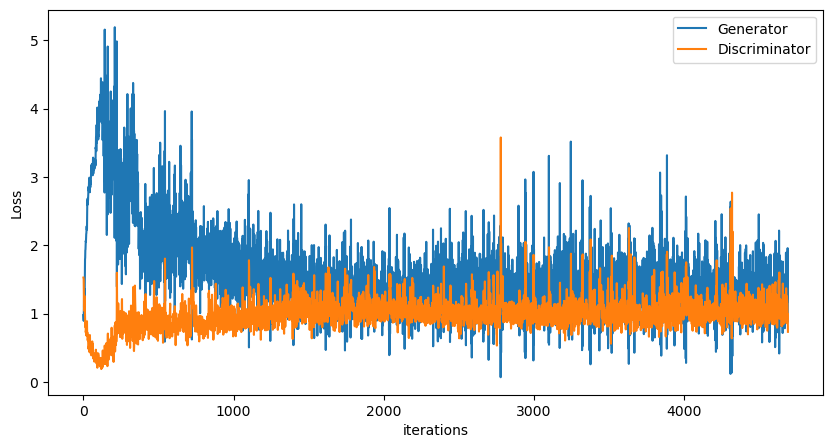

In [9]:
G_losses = np.loadtxt("G_losses.txt")
D_losses = np.loadtxt("D_losses.txt")

fig, ax = plt.subplots(figsize=(10,5))
ax.plot(G_losses,label="Generator")
ax.plot(D_losses,label="Discriminator")
ax.set_xlabel("iterations")
ax.set_ylabel("Loss")
ax.legend()
plt.show()

Additionally, we can create an animation of the generator model improving as a function of iteration. 

In [10]:
img_list = np.load("img_list.npy")

import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,4))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

html = HTML(ani.to_jshtml())
display(html)
plt.close()